<a href="https://colab.research.google.com/github/Manoj00709/EDA-project/blob/main/Logistic_prjt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Google Play store

![](https://resize.indiatvnews.com/en/resize/newbucket/1200_-/2024/09/google-play-store-new-feature-1725299476.jpg)

![](https://developers.google.com/static/android/work/play/emm-api/images/managed-google-play-iframe.png)


In [ ]:
pip install opendatasets

In [ ]:
import opendatasets as od

In [ ]:
import pandas as pd

In [ ]:
raw_df = pd.read_csv('/content/sample_data/googleplaystore_cleaned.csv')

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
raw_df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000,Free,0.0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000,Free,0.0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000,Free,0.0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000,Free,0.0,Teen,Art & Design,8-Jun-18,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000,Free,0.0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10835,Sya9a Maroc - FR,FAMILY,4.5,38,53M,5000,Free,0.0,Everyone,Education,25-Jul-17,1.48,4.1 and up
10836,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100,Free,0.0,Everyone,Education,6-Jul-18,1,4.1 and up
10837,Parkinson Exercices FR,MEDICAL,4.3,3,9.5M,1000,Free,0.0,Everyone,Medical,20-Jan-17,1,2.2 and up
10838,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,Varies with device,1000,Free,0.0,Mature 17+,Books & Reference,19-Jan-15,Varies with device,Varies with device


In [ ]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10840 entries, 0 to 10839
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          10840 non-null  float64
 3   Reviews         10840 non-null  int64  
 4   Size            10840 non-null  object 
 5   Installs        10840 non-null  int64  
 6   Type            10840 non-null  object 
 7   Price           10840 non-null  float64
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10840 non-null  object 
 12  Android Ver     10840 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 1.1+ MB


In [ ]:
raw_df.dropna(subset=['Current Ver',	'Android Ver'],inplace=True)

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

sns.set_style('darkgrid')

In [ ]:
px.histogram(raw_df, x ='App',color='Content Rating')

In [ ]:
px.histogram(raw_df, x ='App',color='Category')

In [ ]:
px.histogram(raw_df, x='Content Rating',color='Genres')

In [ ]:
px.scatter(raw_df.sample(2000), x='Reviews',y='Rating',color='Current Ver')

In [ ]:
px.scatter(raw_df.sample(2500),
           x= 'Size',
           y = 'App',
           color = 'Android Ver')

<Axes: xlabel='Reviews', ylabel='Rating'>

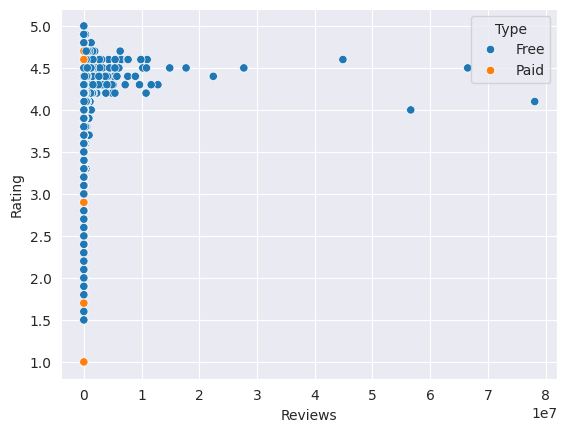

In [ ]:
sns.scatterplot(raw_df.sample(2500),
x="Reviews",
y="Rating",
hue="Type")

## Training, Test and Validation


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_val_df, test_df = train_test_split(raw_df, test_size = 0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size = 0.25, random_state = 42)

In [ ]:
print('train_df.shape:',train_df.shape)
print('Val_df.shape:',val_df.shape)
print('test_df.shape:',test_df.shape)

train_df.shape: (6504, 13)
Val_df.shape: (2168, 13)
test_df.shape: (2168, 13)


In [ ]:
raw_df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000,Free,0.0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000,Free,0.0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000,Free,0.0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000,Free,0.0,Teen,Art & Design,8-Jun-18,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000,Free,0.0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10835,Sya9a Maroc - FR,FAMILY,4.5,38,53M,5000,Free,0.0,Everyone,Education,25-Jul-17,1.48,4.1 and up
10836,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100,Free,0.0,Everyone,Education,6-Jul-18,1,4.1 and up
10837,Parkinson Exercices FR,MEDICAL,4.3,3,9.5M,1000,Free,0.0,Everyone,Medical,20-Jan-17,1,2.2 and up
10838,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,Varies with device,1000,Free,0.0,Mature 17+,Books & Reference,19-Jan-15,Varies with device,Varies with device


<ipython-input-22-9cb07ba0939a>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sns.countplot(x=pd.to_datetime(raw_df['Last Updated']).dt.year);


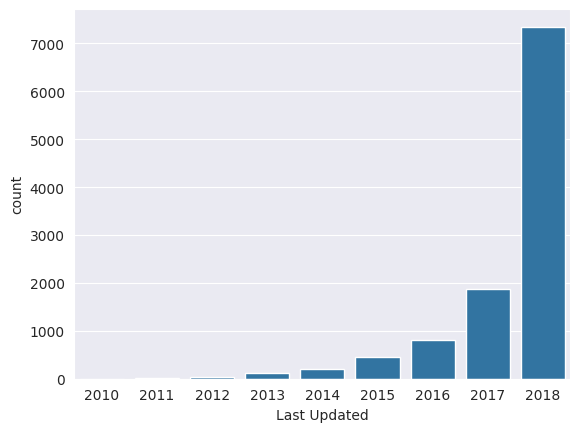

In [ ]:
sns.countplot(x=pd.to_datetime(raw_df['Last Updated']).dt.year);

In [ ]:
year = pd.to_datetime(raw_df['Last Updated']).dt.year

<ipython-input-23-0186643b661c>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  year = pd.to_datetime(raw_df['Last Updated']).dt.year


In [ ]:
train_df = raw_df[year < 2015]
val_df = raw_df[year == 2015]
test_df = raw_df[year > 2015]

In [ ]:
print('train_df.shape:',train_df.shape)
print('Val_df.shape:',val_df.shape)
print('test_df.shape:',test_df.shape)

train_df.shape: (361, 13)
Val_df.shape: (459, 13)
test_df.shape: (10020, 13)


In [ ]:
train_df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
58,Restart Navigator,AUTO_AND_VEHICLES,4.0,1403,201k,100000,Free,0.00,Everyone,Auto & Vehicles,26-Aug-14,1.0.1,2.2 and up
170,Flybook,BOOKS_AND_REFERENCE,3.9,1778,4.9M,500000,Free,0.00,Mature 17+,Books & Reference,16-Oct-14,1.0.3,2.1 and up
458,GO Notifier,COMMUNICATION,4.2,124346,695k,10000000,Free,0.00,Everyone,Communication,6-Jul-14,2.8,2.0 and up
753,C++ Tutorials,EDUCATION,4.1,358,1.9M,50000,Free,0.00,Everyone,Education,21-Aug-14,1.1,2.3 and up
768,Pocket GMAT Math,EDUCATION,4.3,656,556k,10000,Free,0.00,Everyone,Education,11-Jul-14,1.1,2.2 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10797,Word Search Tab 1 FR,FAMILY,4.3,0,1020k,50,Paid,1.04,Everyone,Puzzle,6-Feb-12,1.1,3.0 and up
10807,lesparticuliers.fr,LIFESTYLE,4.3,96,1.0M,50000,Free,0.00,Everyone,Lifestyle,25-Nov-14,1.5,2.3 and up
10829,News Minecraft.fr,NEWS_AND_MAGAZINES,3.8,881,2.3M,100000,Free,0.00,Everyone,News & Magazines,20-Jan-14,1.5,1.6 and up
10831,FR Tides,WEATHER,3.8,1195,582k,100000,Free,0.00,Everyone,Weather,16-Feb-14,6,2.1 and up


In [ ]:
val_df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
144,Cool Reader,BOOKS_AND_REFERENCE,4.5,246315,Varies with device,10000000,Free,0.00,Everyone,Books & Reference,17-Jul-15,Varies with device,1.5 and up
185,URBANO V 02 instruction manual,BOOKS_AND_REFERENCE,4.3,114,7.3M,100000,Free,0.00,Everyone,Books & Reference,7-Aug-15,1.1,5.1 and up
209,Plugin:AOT v5.0,BUSINESS,3.1,4034,23k,100000,Free,0.00,Everyone,Business,11-Sep-15,3.0.1.11 (Build 311),2.2 and up
384,Hangouts Dialer - Call Phones,COMMUNICATION,4.0,122498,79k,10000000,Free,0.00,Everyone,Communication,2-Sep-15,0.1.100944346,4.0.3 and up
426,Web Browser,COMMUNICATION,4.2,10965,2.3M,500000,Free,0.00,Everyone,Communication,2-Feb-15,2,3.0 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10781,Trine 2: Complete Story,GAME,3.8,252,11M,10000,Paid,16.99,Teen,Action,27-Feb-15,2.22,5.0 and up
10801,FR: My Famous Lover,FAMILY,4.0,185,28M,10000,Free,0.00,Teen,Entertainment,6-Aug-15,1.3.0,3.0 and up
10813,FR: My Secret Pets!,FAMILY,4.0,785,31M,50000,Free,0.00,Teen,Entertainment,3-Jun-15,1.3.1,3.0 and up
10816,HTC Sense Input - FR,TOOLS,4.0,885,8.0M,100000,Free,0.00,Everyone,Tools,30-Oct-15,1.0.612928,5.0 and up


In [ ]:
test_df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000,Free,0.0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000,Free,0.0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000,Free,0.0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000,Free,0.0,Teen,Art & Design,8-Jun-18,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000,Free,0.0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10834,FR Forms,BUSINESS,4.3,0,9.6M,10,Free,0.0,Everyone,Business,29-Sep-16,1.1.5,4.0 and up
10835,Sya9a Maroc - FR,FAMILY,4.5,38,53M,5000,Free,0.0,Everyone,Education,25-Jul-17,1.48,4.1 and up
10836,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100,Free,0.0,Everyone,Education,6-Jul-18,1,4.1 and up
10837,Parkinson Exercices FR,MEDICAL,4.3,3,9.5M,1000,Free,0.0,Everyone,Medical,20-Jan-17,1,2.2 and up


## Identifying Input and Target Columns

In [ ]:
input_cols = list(train_df.columns)[1:-1]
target_col = "Android Ver"
print(input_cols)

['Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type', 'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver']


In [ ]:
target_col

'Android Ver'

In [ ]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [ ]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [ ]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [ ]:
train_inputs

,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver
58,AUTO_AND_VEHICLES,4.0,1403,201k,100000,Free,0.00,Everyone,Auto & Vehicles,26-Aug-14,1.0.1
170,BOOKS_AND_REFERENCE,3.9,1778,4.9M,500000,Free,0.00,Mature 17+,Books & Reference,16-Oct-14,1.0.3
458,COMMUNICATION,4.2,124346,695k,10000000,Free,0.00,Everyone,Communication,6-Jul-14,2.8
753,EDUCATION,4.1,358,1.9M,50000,Free,0.00,Everyone,Education,21-Aug-14,1.1
768,EDUCATION,4.3,656,556k,10000,Free,0.00,Everyone,Education,11-Jul-14,1.1
...,...,...,...,...,...,...,...,...,...,...,...
10797,FAMILY,4.3,0,1020k,50,Paid,1.04,Everyone,Puzzle,6-Feb-12,1.1
10807,LIFESTYLE,4.3,96,1.0M,50000,Free,0.00,Everyone,Lifestyle,25-Nov-14,1.5
10829,NEWS_AND_MAGAZINES,3.8,881,2.3M,100000,Free,0.00,Everyone,News & Magazines,20-Jan-14,1.5
10831,WEATHER,3.8,1195,582k,100000,Free,0.00,Everyone,Weather,16-Feb-14,6


In [ ]:
test_inputs

,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver
0,ART_AND_DESIGN,4.1,159,19M,10000,Free,0.0,Everyone,Art & Design,7-Jan-18,1.0.0
1,ART_AND_DESIGN,3.9,967,14M,500000,Free,0.0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0
2,ART_AND_DESIGN,4.7,87510,8.7M,5000000,Free,0.0,Everyone,Art & Design,1-Aug-18,1.2.4
3,ART_AND_DESIGN,4.5,215644,25M,50000000,Free,0.0,Teen,Art & Design,8-Jun-18,Varies with device
4,ART_AND_DESIGN,4.3,967,2.8M,100000,Free,0.0,Everyone,Art & Design;Creativity,20-Jun-18,1.1
...,...,...,...,...,...,...,...,...,...,...,...
10834,BUSINESS,4.3,0,9.6M,10,Free,0.0,Everyone,Business,29-Sep-16,1.1.5
10835,FAMILY,4.5,38,53M,5000,Free,0.0,Everyone,Education,25-Jul-17,1.48
10836,FAMILY,5.0,4,3.6M,100,Free,0.0,Everyone,Education,6-Jul-18,1
10837,MEDICAL,4.3,3,9.5M,1000,Free,0.0,Everyone,Medical,20-Jan-17,1


In [ ]:
val_inputs

,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver
144,BOOKS_AND_REFERENCE,4.5,246315,Varies with device,10000000,Free,0.00,Everyone,Books & Reference,17-Jul-15,Varies with device
185,BOOKS_AND_REFERENCE,4.3,114,7.3M,100000,Free,0.00,Everyone,Books & Reference,7-Aug-15,1.1
209,BUSINESS,3.1,4034,23k,100000,Free,0.00,Everyone,Business,11-Sep-15,3.0.1.11 (Build 311)
384,COMMUNICATION,4.0,122498,79k,10000000,Free,0.00,Everyone,Communication,2-Sep-15,0.1.100944346
426,COMMUNICATION,4.2,10965,2.3M,500000,Free,0.00,Everyone,Communication,2-Feb-15,2
...,...,...,...,...,...,...,...,...,...,...,...
10781,GAME,3.8,252,11M,10000,Paid,16.99,Teen,Action,27-Feb-15,2.22
10801,FAMILY,4.0,185,28M,10000,Free,0.00,Teen,Entertainment,6-Aug-15,1.3.0
10813,FAMILY,4.0,785,31M,50000,Free,0.00,Teen,Entertainment,3-Jun-15,1.3.1
10816,TOOLS,4.0,885,8.0M,100000,Free,0.00,Everyone,Tools,30-Oct-15,1.0.612928


In [ ]:
import numpy as np

In [ ]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [ ]:
numeric_cols

['Rating', 'Reviews', 'Installs', 'Price']

In [ ]:
categorical_cols

['Category',
 'Size',
 'Type',
 'Content Rating',
 'Genres',
 'Last Updated',
 'Current Ver']

In [ ]:
train_inputs[numeric_cols].describe()

,Rating,Reviews,Installs,Price
count,361.000000,3.610000e+02,3.610000e+02,361.000000
mean,4.059003,2.952773e+04,1.120906e+06,1.113435
std,0.523432,1.521716e+05,5.484554e+06,3.513594
min,1.000000,0.000000e+00,1.000000e+00,0.000000
25%,3.900000,3.900000e+01,1.000000e+03,0.000000
50%,4.200000,3.980000e+02,1.000000e+04,0.000000
75%,4.300000,2.394000e+03,1.000000e+05,0.990000
max,5.000000,1.736105e+06,5.000000e+07,29.990000


In [ ]:
train_inputs[categorical_cols].nunique()

,0
Category,25
Size,212
Type,2
Content Rating,5
Genres,44
Last Updated,269
Current Ver,138


In [ ]:
raw_df[numeric_cols].describe()

,Rating,Reviews,Installs,Price
count,10840.000000,1.084000e+04,1.084000e+04,10840.000000
mean,4.206476,4.441529e+05,1.546434e+07,1.027368
std,0.480342,2.927761e+06,8.502936e+07,15.949703
min,1.000000,0.000000e+00,0.000000e+00,0.000000
25%,4.100000,3.800000e+01,1.000000e+03,0.000000
50%,4.300000,2.094000e+03,1.000000e+05,0.000000
75%,4.500000,5.477550e+04,5.000000e+06,0.000000
max,5.000000,7.815831e+07,1.000000e+09,400.000000


In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler()

In [ ]:
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [ ]:
train_inputs[numeric_cols].describe()

,Rating,Reviews,Installs,Price
count,361.000000,3.610000e+02,3.610000e+02,361.000000
mean,0.764751,3.777939e-04,1.120906e-03,0.002784
std,0.130858,1.946967e-03,5.484554e-03,0.008784
min,0.000000,0.000000e+00,1.000000e-09,0.000000
25%,0.725000,4.989873e-07,1.000000e-06,0.000000
50%,0.800000,5.092229e-06,1.000000e-05,0.000000
75%,0.825000,3.063014e-05,1.000000e-04,0.002475
max,1.000000,2.221267e-02,5.000000e-02,0.074975


In [ ]:
val_inputs[numeric_cols].describe()

,Rating,Reviews,Installs,Price
count,459.000000,4.590000e+02,459.000000,459.000000
mean,0.775817,3.723104e-04,0.000925,0.003326
std,0.115505,2.682024e-03,0.005069,0.024711
min,0.150000,0.000000e+00,0.000000,0.000000
25%,0.725000,1.791236e-07,0.000001,0.000000
50%,0.800000,2.789211e-06,0.000010,0.000000
75%,0.825000,5.576503e-05,0.000100,0.000000
max,1.000000,5.306817e-02,0.100000,0.500000


In [ ]:
raw_df[categorical_cols].nunique()

,0
Category,33
Size,461
Type,2
Content Rating,6
Genres,119
Last Updated,1377
Current Ver,2783


In [ ]:
raw_df.shape

(10840, 13)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
encoder = OneHotEncoder(handle_unknown='ignore',sparse_output= False)

In [ ]:
encoder.fit(raw_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [ ]:
encoder.categories_

[array(['ART_AND_DESIGN', 'AUTO_AND_VEHICLES', 'BEAUTY',
        'BOOKS_AND_REFERENCE', 'BUSINESS', 'COMICS', 'COMMUNICATION',
        'DATING', 'EDUCATION', 'ENTERTAINMENT', 'EVENTS', 'FAMILY',
        'FINANCE', 'FOOD_AND_DRINK', 'GAME', 'HEALTH_AND_FITNESS',
        'HOUSE_AND_HOME', 'LIBRARIES_AND_DEMO', 'LIFESTYLE',
        'MAPS_AND_NAVIGATION', 'MEDICAL', 'NEWS_AND_MAGAZINES',
        'PARENTING', 'PERSONALIZATION', 'PHOTOGRAPHY', 'PRODUCTIVITY',
        'SHOPPING', 'SOCIAL', 'SPORTS', 'TOOLS', 'TRAVEL_AND_LOCAL',
        'VIDEO_PLAYERS', 'WEATHER'], dtype=object),
 array(['1.0M', '1.1M', '1.2M', '1.3M', '1.4M', '1.5M', '1.6M', '1.7M',
        '1.8M', '1.9M', '10.0M', '100M', '1020k', '103k', '108k', '10M',
        '116k', '118k', '11M', '11k', '121k', '122k', '12M', '13M', '141k',
        '143k', '144k', '14M', '14k', '153k', '154k', '157k', '15M',
        '160k', '161k', '164k', '169k', '16M', '170k', '172k', '173k',
        '175k', '176k', '17M', '17k', '186k', '18M', '18k', 

In [ ]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Category_ART_AND_DESIGN', 'Category_AUTO_AND_VEHICLES', 'Category_BEAUTY', 'Category_BOOKS_AND_REFERENCE', 'Category_BUSINESS', 'Category_COMICS', 'Category_COMMUNICATION', 'Category_DATING', 'Category_EDUCATION', 'Category_ENTERTAINMENT', 'Category_EVENTS', 'Category_FAMILY', 'Category_FINANCE', 'Category_FOOD_AND_DRINK', 'Category_GAME', 'Category_HEALTH_AND_FITNESS', 'Category_HOUSE_AND_HOME', 'Category_LIBRARIES_AND_DEMO', 'Category_LIFESTYLE', 'Category_MAPS_AND_NAVIGATION', 'Category_MEDICAL', 'Category_NEWS_AND_MAGAZINES', 'Category_PARENTING', 'Category_PERSONALIZATION', 'Category_PHOTOGRAPHY', 'Category_PRODUCTIVITY', 'Category_SHOPPING', 'Category_SOCIAL', 'Category_SPORTS', 'Category_TOOLS', 'Category_TRAVEL_AND_LOCAL', 'Category_VIDEO_PLAYERS', 'Category_WEATHER', 'Size_1.0M', 'Size_1.1M', 'Size_1.2M', 'Size_1.3M', 'Size_1.4M', 'Size_1.5M', 'Size_1.6M', 'Size_1.7M', 'Size_1.8M', 'Size_1.9M', 'Size_10.0M', 'Size_100M', 'Size_1020k', 'Size_103k', 'Size_108k', 'Size_10M', 'S

In [ ]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

Streaming output truncated to the last 5000 lines.
<ipython-input-77-8950d7c1751d>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])
<ipython-input-77-8950d7c1751d>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])
<ipython-input-77-8950d7c1751d>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor

In [ ]:
train_inputs

Category  Rating       Reviews   Size      Installs  Type  \
58       AUTO_AND_VEHICLES   0.750  1.795075e-05   201k  1.000000e-04  Free   
170    BOOKS_AND_REFERENCE   0.725  2.274870e-05   4.9M  5.000000e-04  Free   
458          COMMUNICATION   0.800  1.590951e-03   695k  1.000000e-02  Free   
753              EDUCATION   0.775  4.580447e-06   1.9M  5.000000e-05  Free   
768              EDUCATION   0.825  8.393222e-06   556k  1.000000e-05  Free   
...                    ...     ...           ...    ...           ...   ...   
10797               FAMILY   0.825  0.000000e+00  1020k  5.000000e-08  Paid   
10807            LIFESTYLE   0.825  1.228276e-06   1.0M  5.000000e-05  Free   
10829   NEWS_AND_MAGAZINES   0.700  1.127199e-05   2.3M  1.000000e-04  Free   
10831              WEATHER   0.700  1.528948e-05   582k  1.000000e-04  Free   
10832  BOOKS_AND_REFERENCE   0.950  5.629600e-07   619k  1.000000e-06  Free   

        Price Content Rating             Genres Last Updated Current Ver  \
58     0.0000       Everyone    Auto & Vehicles    26-Aug-14       1.0.1   
170    0.0000     Mature 17+  Books & Reference    16-Oct-14       1.0.3   
458    0.0000       Everyone      Communication     6-Jul-14         2.8   
753    0.0000       Everyone          Education    21-Aug-14         1.1   
768    0.0000       Everyone          Education    11-Jul-14         1.1   
...       ...            ...                ...          ...         ...   
10797  0.0026       Everyone             Puzzle     6-Feb-12         1.1   
10807  0.0000       Everyone          Lifestyle    25-Nov-14         1.5   
10829  0.0000       Everyone   News & Magazines    20-Jan-14         1.5   
10831  0.0000       Everyone            Weather    16-Feb-14           6   
10832  0.0000       Everyone  Books & Reference    23-Mar-14         0.8   

       Category_ART_AND_DESIGN  Category_AUTO_AND_VEHICLES  Category_BEAUTY  \
58                         0.0                         1.0              0.0   
170                        0.0                         0.0              0.0   
458                        0.0                         0.0              0.0   
753                        0.0                         0.0              0.0   
768                        0.0                         0.0              0.0   
...                        ...                         ...              ...   
10797                      0.0                         0.0              0.0   
10807                      0.0                         0.0              0.0   
10829                      0.0                         0.0              0.0   
10831                      0.0                         0.0              0.0   
10832                      0.0                         0.0              0.0   

       Category_BOOKS_AND_REFERENCE  Category_BUSINESS  Category_COMICS  \
58                              0.0                0.0              0.0   
170                             1.0                0.0              0.0   
458                             0.0                0.0              0.0   
753                             0.0                0.0              0.0   
768                             0.0                0.0              0.0   
...                             ...                ...              ...   
10797                           0.0                0.0              0.0   
10807                           0.0                0.0              0.0   
10829                           0.0                0.0              0.0   
10831                           0.0                0.0              0.0   
10832                           1.0                0.0              0.0   

       Category_COMMUNICATION  Category_DATING  Category_EDUCATION  \
58                        0.0              0.0                 0.0   
170                       0.0              0.0                 0.0   
458                       1.0              0.0                 0.0   
753                       

In [ ]:
test_inputs

Category  Rating       Reviews  Size      Installs  Type  Price  \
0      ART_AND_DESIGN   0.775  2.034333e-06   19M  1.000000e-05  Free    0.0   
1      ART_AND_DESIGN   0.725  1.237233e-05   14M  5.000000e-04  Free    0.0   
2      ART_AND_DESIGN   0.925  1.119651e-03  8.7M  5.000000e-03  Free    0.0   
3      ART_AND_DESIGN   0.875  2.759067e-03   25M  5.000000e-02  Free    0.0   
4      ART_AND_DESIGN   0.825  1.237233e-05  2.8M  1.000000e-04  Free    0.0   
...               ...     ...           ...   ...           ...   ...    ...   
10834        BUSINESS   0.825  0.000000e+00  9.6M  1.000000e-08  Free    0.0   
10835          FAMILY   0.875  4.861927e-07   53M  5.000000e-06  Free    0.0   
10836          FAMILY   1.000  5.117818e-08  3.6M  1.000000e-07  Free    0.0   
10837         MEDICAL   0.825  3.838364e-08  9.5M  1.000000e-06  Free    0.0   
10839       LIFESTYLE   0.875  5.096157e-03   19M  1.000000e-02  Free    0.0   

      Content Rating                     Genres Last Updated  \
0           Everyone               Art & Design     7-Jan-18   
1           Everyone  Art & Design;Pretend Play    15-Jan-18   
2           Everyone               Art & Design     1-Aug-18   
3               Teen               Art & Design     8-Jun-18   
4           Everyone    Art & Design;Creativity    20-Jun-18   
...              ...                        ...          ...   
10834       Everyone                   Business    29-Sep-16   
10835       Everyone                  Education    25-Jul-17   
10836       Everyone                  Education     6-Jul-18   
10837       Everyone                    Medical    20-Jan-17   
10839       Everyone                  Lifestyle    25-Jul-18   

              Current Ver  Category_ART_AND_DESIGN  \
0                   1.0.0                      1.0   
1                   2.0.0                      1.0   
2                   1.2.4                      1.0   
3      Varies with device                      1.0   
4                     1.1                      1.0   
...                   ...                      ...   
10834               1.1.5                      0.0   
10835                1.48                      0.0   
10836                   1                      0.0   
10837                   1                      0.0   
10839  Varies with device                      0.0   

       Category_AUTO_AND_VEHICLES  Category_BEAUTY  \
0                             0.0              0.0   
1                             0.0              0.0   
2                             0.0              0.0   
3                             0.0              0.0   
4                             0.0              0.0   
...                           ...              ...   
10834                         0.0              0.0   
10835                         0.0              0.0   
10836                         0.0              0.0   
10837                         0.0              0.0   
10839                         0.0              0.0   

       Category_BOOKS_AND_REFERENCE  Category_BUSINESS  Category_COMICS  \
0                               0.0                0.0              0.0   
1                               0.0                0.0              0.0   
2                               0.0                0.0              0.0   
3                               0.0                0.0              0.0   
4                               0.0                0.0              0.0   
...                             ...                ...              ...   
10834                           0.0                1.0              0.0   
10835                           0.0                0.0              0.0   
10836                           0.0                0.0              0.0   
10837                           0.0                0.0              0.0   
10839                           0.0                0.0              0.0   

       Category_COMMUNICATION  Category_DATING  Category_EDUCATION  \
0             

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression(solver='liblinear')

In [ ]:
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [ ]:
print(numeric_cols + encoded_cols)

['Rating', 'Reviews', 'Installs', 'Price', 'Category_ART_AND_DESIGN', 'Category_AUTO_AND_VEHICLES', 'Category_BEAUTY', 'Category_BOOKS_AND_REFERENCE', 'Category_BUSINESS', 'Category_COMICS', 'Category_COMMUNICATION', 'Category_DATING', 'Category_EDUCATION', 'Category_ENTERTAINMENT', 'Category_EVENTS', 'Category_FAMILY', 'Category_FINANCE', 'Category_FOOD_AND_DRINK', 'Category_GAME', 'Category_HEALTH_AND_FITNESS', 'Category_HOUSE_AND_HOME', 'Category_LIBRARIES_AND_DEMO', 'Category_LIFESTYLE', 'Category_MAPS_AND_NAVIGATION', 'Category_MEDICAL', 'Category_NEWS_AND_MAGAZINES', 'Category_PARENTING', 'Category_PERSONALIZATION', 'Category_PHOTOGRAPHY', 'Category_PRODUCTIVITY', 'Category_SHOPPING', 'Category_SOCIAL', 'Category_SPORTS', 'Category_TOOLS', 'Category_TRAVEL_AND_LOCAL', 'Category_VIDEO_PLAYERS', 'Category_WEATHER', 'Size_1.0M', 'Size_1.1M', 'Size_1.2M', 'Size_1.3M', 'Size_1.4M', 'Size_1.5M', 'Size_1.6M', 'Size_1.7M', 'Size_1.8M', 'Size_1.9M', 'Size_10.0M', 'Size_100M', 'Size_1020k'

In [ ]:
print(model.coef_.tolist())

[[-1.369178218564165, -0.0010868483911885003, -0.0030742345836490704, -0.008030730525926741, 0.0, -0.0067116993438988155, 0.0, -0.08542389318130175, -0.09031025991975193, 0.0, -0.08591780721060133, 0.0, -0.02241453425260625, 0.0, 0.0, -0.40091658743229297, -0.022634602013291965, 0.0, -0.36042718512115934, -0.04108770329061607, -0.008426797868943074, -0.029004573383822937, -0.06656255804426219, -0.02514305627745752, -0.16991943329037032, -0.02715210164905393, 0.0, -0.16107732186867918, -0.041505363510420445, -0.11260264718458793, -0.01451145365376868, -0.05268180744329681, -0.05041677346811679, 0.27500904931649583, -0.022673993617608308, -0.06156336136447682, -0.04177226894434075, -0.021195932432311375, -0.028907912629689666, -0.03555110292650418, -0.010640515527207607, -0.020259610983574493, -0.020635602279899707, -0.008068911874460837, 0.0, -0.014706186081705026, -0.029574466290204802, -0.008362141766295156, 0.0, -0.004973883529583485, -0.009371171096869867, -0.005157889284738419, -0.

In [ ]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [ ]:
train_preds = model.predict(X_train)

In [ ]:
train_preds

array(['2.2 and up', '2.1 and up', '2.0 and up', '2.3 and up',
       '2.2 and up', '2.1 and up', '2.1 and up', 'Varies with device',
       '2.3 and up', '2.2 and up', '2.2 and up', '1.6 and up',
       '1.5 and up', '2.2 and up', '2.2 and up', '2.3.3 and up',
       '2.2 and up', '4.0 and up', '2.2 and up', '4.0 and up',
       '2.2 and up', '4.0.3 and up', '4.0.3 and up', '4.0 and up',
       '2.1 and up', '3.0 and up', '2.3 and up', '2.3.3 and up',
       'Varies with device', '3.2 and up', '2.2 and up', '4.0.3 and up',
       '4.0 and up', '3.0 and up', '2.2 and up', '4.4 and up',
       'Varies with device', '4.1 and up', '4.1 and up', '4.1 and up',
       '2.2 and up', '1.6 and up', '2.1 and up', '2.1 and up',
       '2.2 and up', '2.3 and up', '2.1 and up', '2.1 and up',
       '2.1 and up', '2.2 and up', '4.2 and up', 'Varies with device',
       '2.2 and up', '2.3.3 and up', '2.2 and up', '4.0.3 and up',
       '2.2 and up', '2.3.3 and up', '2.3.3 and up', '2.1 and up',
     

In [ ]:
train_targets

,Android Ver
58,2.2 and up
170,2.1 and up
458,2.0 and up
753,2.3 and up
768,2.2 and up
...,...
10797,3.0 and up
10807,2.3 and up
10829,1.6 and up
10831,2.1 and up


In [ ]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.0064537 , 0.03313758, 0.03845845, ..., 0.00639226, 0.00661881,
        0.01324329],
       [0.01195135, 0.01248428, 0.0592832 , ..., 0.01154753, 0.01235616,
        0.02016499],
       [0.00562153, 0.01298665, 0.05188524, ..., 0.00554968, 0.0056742 ,
        0.01066378],
       ...,
       [0.00684688, 0.02772289, 0.30742216, ..., 0.00644682, 0.00692993,
        0.01030297],
       [0.00630849, 0.01563126, 0.06876051, ..., 0.00614898, 0.00639601,
        0.02674596],
       [0.00453969, 0.01007479, 0.09367389, ..., 0.00460655, 0.00471492,
        0.01272926]])

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [ ]:
accuracy_score(train_targets, train_preds)

0.9390581717451524